In [60]:
import os
import pandas as pd
import tensorflow_hub as hub
import tensorflow as tf
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm # 반복문의 진행상황 확인하는 모듈
import time
from scipy.spatial import distance

# 경고끄기 (option)
import warnings
warnings.filterwarnings('ignore')

In [273]:
model_dict = dict()

model_dict['bag'] = 'R50x1_object'
model_dict['cap'] = 'R50x1_clothing'
model_dict['car_key'] = 'Mobilenet_v2'
model_dict['card'] = 'R50x1_object'
model_dict['cloth'] = 'R50x1_clothing'
model_dict['document'] = 'R50x1_object'
model_dict['earphones'] = 'R50x1_object'
model_dict['necklace'] = 'Mobilenet_v2'
model_dict['phone'] = 'R50x1_equipment'
model_dict['ring'] = 'R101x3'
model_dict['shoes'] = 'R101x3'
model_dict['shopping_bag'] = 'Mobilenet_v2'
model_dict['wallet'] = 'R50x1_object'
model_dict['watch'] = 'R50x1_equipment'


In [380]:
category = 'shoes'
model_path = '../models/'

model_name = model_dict[category]
model_url = model_path + model_name
tmp_model = tf.saved_model.load(model_url)

IMAGE_SHAPE = (224, 224)
layer = hub.KerasLayer(tmp_model, input_shape=IMAGE_SHAPE+(3,))
model = tf.keras.Sequential([layer])
model.summary()

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_18 (KerasLayer)  (None, 6144)             381789888 
                                                                 
Total params: 381,789,888
Trainable params: 0
Non-trainable params: 381,789,888
_________________________________________________________________


In [381]:
model_name

'R101x3'

In [382]:
from pathlib import Path
p = str(Path(os.getcwd()).parents[0])

image_path =  p + f"/crops/{category}/"
output_path = f"../vector_frame/{category}/"

In [383]:
print(image_path)
print(output_path)

/Users/iseongmin/workspaces/project2/crops/shoes/
../vector_frame/shoes/


In [384]:
def extract(file):
    file = Image.open(file).convert('RGB').resize((224, 224))
    file = np.array(file)/255.0 # 정규화

    embedding = model.predict(file[np.newaxis, ...])
    feature_np = np.array(embedding)
    flattened_feature = feature_np.flatten()

    return flattened_feature

In [385]:
def get_dataframe(category=category, model_name=model_name):
    global output_path    
    tmp_filename = np.load(output_path+f'{category}_filename({model_name}).npy', allow_pickle=True)
    tmp_output = np.load(output_path+f'{category}_output({model_name}).npy', allow_pickle=True)
    df = pd.DataFrame({'filename':tmp_filename, 'output':tmp_output})
    return df

In [386]:
get_dataframe()

,filename,output
0,V0000354H04130006-1.jpg,"[0.7708816, 0.1884391, 0.16157416, 0.24483648,..."
1,F2022072000001465-1.jpg,"[0.06250143, 0.8378809, 0.17050081, 1.0030456,..."
2,V0002076H04070002-1.jpg,"[1.8156546, 0.0, 1.0234034, 1.4184706, 0.0, 0...."
3,F2022070100000950-1.jpg,"[0.47078896, 0.047316723, 0.14943959, 0.116845..."
4,F2022070800002458-1.jpg,"[0.32016712, 0.36653367, 0.014648985, 0.521464..."
...,...,...
108,F2022041700001658-1.jpg,"[0.0, 0.21239902, 0.59569603, 0.0, 0.0, 0.0, 0..."
109,F2022052800000781-1.jpg,"[0.0014332788, 0.0, 0.75073606, 0.13520303, 0...."
110,F2022072600002960-1.jpg,"[0.14405784, 0.14554045, 0.35905662, 0.8668062..."
111,F2022071400001642-1.jpg,"[0.63900554, 3.0967753, 0.2933576, 1.8863977, ..."


In [387]:
def get_cos_sim(file, category=category, metric='cosine'):
    before_time = time.time()
    file2vec = extract(file) # 이미지 벡터화
    df = get_dataframe() # 데이터프레임 가져오기
    df = df.append({'filename':file, 'output':file2vec}, ignore_index=True)
    
    cos_sim_array = np.zeros((len(df)))
    for i in range(0, len(df)):
        cos_sim_array[i] = distance.cdist([file2vec] , [df.iloc[i, 1]], metric)[0] # 벡터화된 이미지 기준
    df['cos_sim']=cos_sim_array
    after_time = time.time()
    runtime = after_time-before_time
    return df, runtime # 런타임 비교용

In [388]:
def show_sim(input_file):
    global image_path
    global output_path
    cos_sim_df, runtime = get_cos_sim(input_file)
    df_top_sim = cos_sim_df.sort_values(by='cos_sim')[:15]

    # 그래프 그리는 부분은 서비스 시 생략 가능
    f, ax = plt.subplots(3, 5, figsize=(40, 20))

    for i in range(len(df_top_sim)):
        if i == 0: 
            tmp_img = Image.open(df_top_sim.iloc[i, 0]).convert('RGB')
            title = f'Original \n{df_top_sim.iloc[i, 0]}'
        else : 
            tmp_img = Image.open(image_path+'/'+df_top_sim.iloc[i, 0]).convert('RGB')
            title = f'similarity no.{i} \n{df_top_sim.iloc[i, 0]}'

        sim = f'cos : {df_top_sim.iloc[i, 2]:.3f}' 
        ax[i//5][i%5].imshow(tmp_img, aspect='auto')
        ax[i//5][i%5].set_title(title, pad=20, size=25) # 5열짜리 표를 만드는 것이므로 단순히 5로 나눈 나머지와 몫을 사용한 것임
        ax[i//5][i%5].annotate(sim, (0,10), fontsize=18, color='red')
    
    print(f'소요시간 : {runtime:.3f}')
    plt.show()

In [389]:
def show_sim_threshold(input_file, threshold, savefig=False):
    global image_path
    global output_path
    cos_sim_df, runtime = get_cos_sim(input_file)
    df_top_sim = cos_sim_df[cos_sim_df.cos_sim <= threshold].sort_values(by='cos_sim')[:50]
    # 그래프 그리는 부분은 서비스 시 생략 가능
    if len(df_top_sim) <= 10:
        f, ax = plt.subplots(2, 5, figsize=(40, 20))
    elif len(df_top_sim) <=15:
        f, ax = plt.subplots(3, 5, figsize=(40, 30))
    elif len(df_top_sim) <=20:
        f, ax = plt.subplots(4, 5, figsize=(40, 40))
    elif len(df_top_sim) <=25:
        f, ax = plt.subplots(5, 5, figsize=(40, 45))
    elif len(df_top_sim) <=30:
        f, ax = plt.subplots(6, 5, figsize=(40, 50))
    elif len(df_top_sim) <=35:
        f, ax = plt.subplots(7, 5, figsize=(40, 50))
    elif len(df_top_sim) <=40:
        f, ax = plt.subplots(8, 5, figsize=(40, 50))
    elif len(df_top_sim) <=45:
        f, ax = plt.subplots(9, 5, figsize=(40, 50))
    else:
        f, ax = plt.subplots(10, 5, figsize=(40, 50))

    for i in range(len(df_top_sim)):
        if i == 0:
            tmp_img = Image.open(df_top_sim.iloc[i, 0]).convert('RGB')
            title = f'Original \n{df_top_sim.iloc[i, 0]}'
        else :
            tmp_img = Image.open(image_path+'/'+df_top_sim.iloc[i, 0]).convert('RGB')
            title = f'similarity no.{i} \n{df_top_sim.iloc[i, 0]}'

        sim = f'cos : {df_top_sim.iloc[i, 2]:.3f}' 
        ax[i//5][i%5].imshow(tmp_img, aspect='auto')
        ax[i//5][i%5].set_title(title, pad=20, size=25) # 5열짜리 표를 만드는 것이므로 단순히 5로 나눈 나머지와 몫을 사용한 것임
        ax[i//5][i%5].annotate(sim, (0,10), fontsize=25, color='red')
    
    if savefig:
        global model_name
        global input_file_path
        if not os.path.exists(input_file_path + '/test_result'):
            os.makedirs(input_file_path + './test_result')
        plt.savefig(f'{input_file_path}/test_result/{model_name}_{threshold}_test_result_{time.strftime("%H_%M_%S")}.jpg', pad_inches=0)
    print(f'소요시간 : {runtime:.3f}')
    plt.show()

In [390]:
get_dataframe()

,filename,output
0,V0000354H04130006-1.jpg,"[0.7708816, 0.1884391, 0.16157416, 0.24483648,..."
1,F2022072000001465-1.jpg,"[0.06250143, 0.8378809, 0.17050081, 1.0030456,..."
2,V0002076H04070002-1.jpg,"[1.8156546, 0.0, 1.0234034, 1.4184706, 0.0, 0...."
3,F2022070100000950-1.jpg,"[0.47078896, 0.047316723, 0.14943959, 0.116845..."
4,F2022070800002458-1.jpg,"[0.32016712, 0.36653367, 0.014648985, 0.521464..."
...,...,...
108,F2022041700001658-1.jpg,"[0.0, 0.21239902, 0.59569603, 0.0, 0.0, 0.0, 0..."
109,F2022052800000781-1.jpg,"[0.0014332788, 0.0, 0.75073606, 0.13520303, 0...."
110,F2022072600002960-1.jpg,"[0.14405784, 0.14554045, 0.35905662, 0.8668062..."
111,F2022071400001642-1.jpg,"[0.63900554, 3.0967753, 0.2933576, 1.8863977, ..."


In [391]:
input_file_path = f'../test_image/{category}/'
input_file_list = os.listdir(f'../test_image/{category}/')
input_files = [input_file_path+file for file in input_file_list if file.endswith(".png") or file.endswith(".jpeg") or file.endswith(".jpg")]

__test_image 폴더에 카테고리 폴더 만들어서 테스트 사진 넣어주기__

In [392]:
input_files

['../test_image/shoes/117f5b49-1d09-4550-8ab7-87c0d82614de.jpeg',
 '../test_image/shoes/스크린샷 2022-09-19 15.41.40.png',
 '../test_image/shoes/스크린샷 2022-09-19 15.43.35.png',
 '../test_image/shoes/스크린샷 2022-09-19 15.41.25.png']

In [393]:
threshold = 0.4 # 임계값은 변경해가면서 확인 가능

2022-09-19 17:48:06.975312: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 12s 12s/step
소요시간 : 12.170


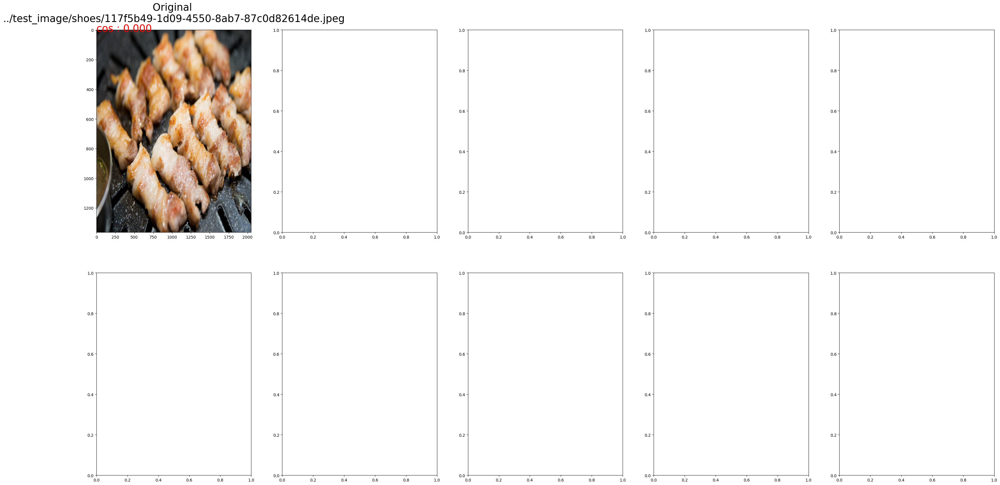

In [394]:
show_sim_threshold(input_files[0], threshold=threshold, savefig=True)

1/1 [==============================] - 1s 1s/step
소요시간 : 1.098


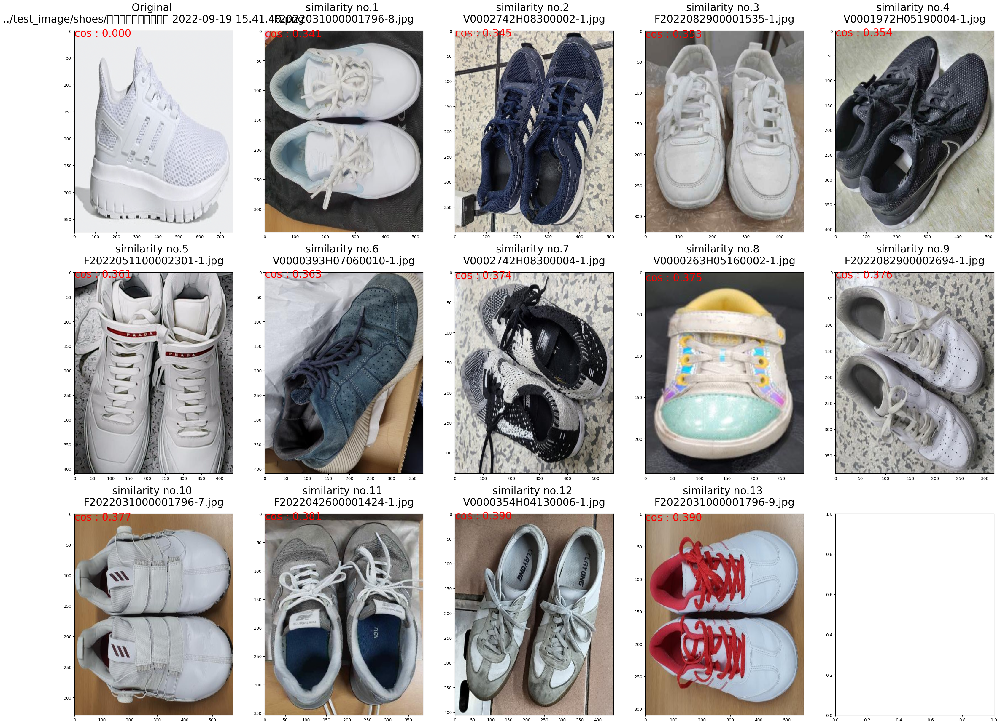

In [395]:
show_sim_threshold(input_files[1], threshold=threshold, savefig=True)

1/1 [==============================] - 1s 1s/step
소요시간 : 1.461


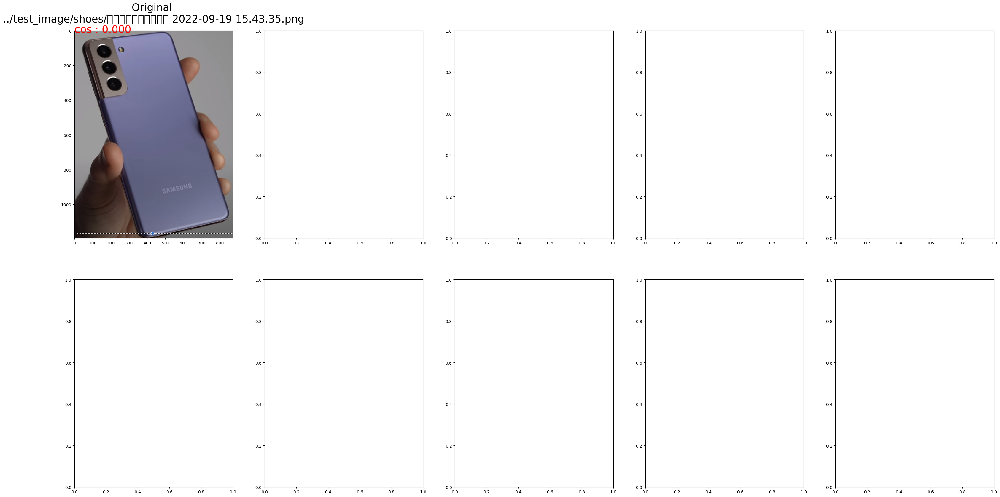

In [396]:
show_sim_threshold(input_files[2], threshold=threshold, savefig=True)

1/1 [==============================] - 0s 338ms/step
소요시간 : 0.421


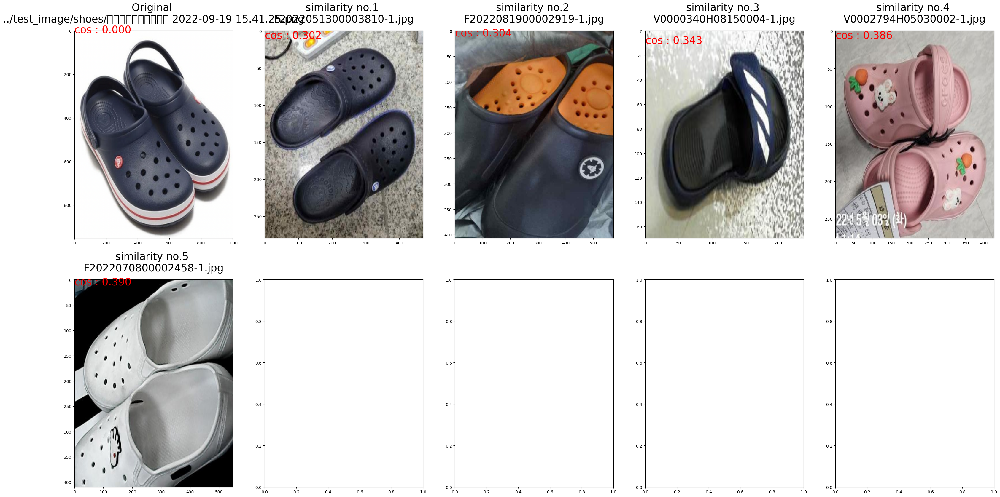

In [397]:
show_sim_threshold(input_files[3], threshold=threshold, savefig=True)

In [398]:
show_sim_threshold(input_files[4], threshold=threshold, savefig=True)

IndexError: list index out of range